# Image Processing


## HOG Features

1. Write a Python script to compute the HOG features of a given image using a library such as
OpenCV or scikit-image.
2. Apply your implementation to at least three different images, including both simple and
complex scenes.
3. Visualize the original image, the gradient image, and the HOG feature image.
4. Compare the HOG features extracted from different images. Discuss the impact of varying
parameters like cell size, block size, and the number of bins on the resulting HOG
descriptors.

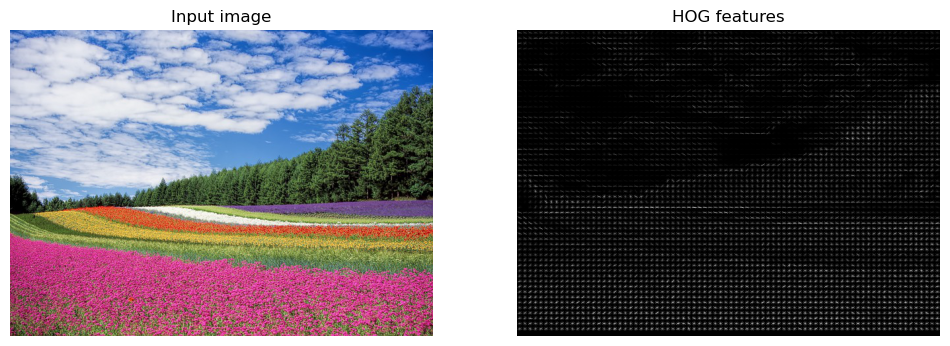

In [83]:
from skimage import feature, io, color
import matplotlib.pyplot as plt

# Load the image

image = io.imread('flower_field.jpg')

# Convert the image to grayscale
#image = color.rgb2(image)

# Compute HOG features and the HOG image
hog_features, hog_image = feature.hog(image, 
                                      pixels_per_cell=(8, 8),
                                      cells_per_block=(2, 2),
                                      visualize=True,
                                      channel_axis=-1
                                      )

# Plot the original image and the HOG image
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6), sharex=True, sharey=True)

ax1.axis('off')
ax1.imshow(image)
ax1.set_title('Input image')

ax2.axis('off')
ax2.imshow(hog_image, cmap=plt.cm.gray)
ax2.set_title('HOG features')

plt.show()

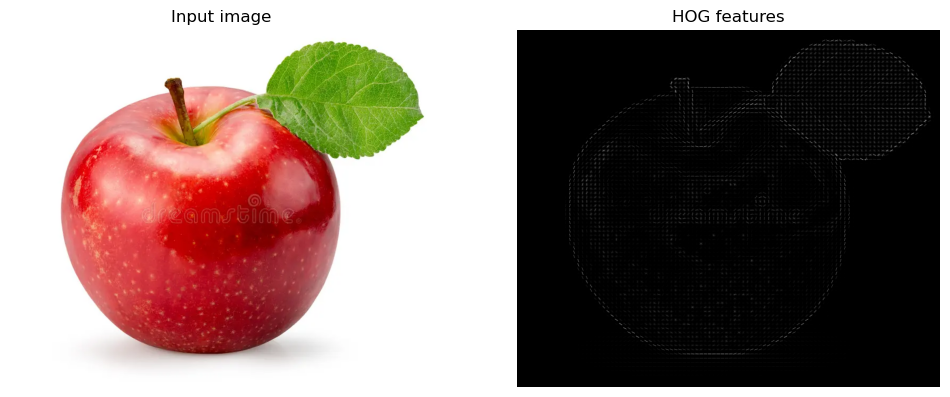

In [84]:
# Load the image

image = io.imread('red_apple.webp')

# Convert the image to grayscale
#image = color.rgb2(image)

# Compute HOG features and the HOG image
hog_features, hog_image = feature.hog(image, 
                                      pixels_per_cell=(8, 8),
                                      cells_per_block=(2, 2),
                                      visualize=True,
                                      channel_axis=-1
                                      )

# Plot the original image and the HOG image
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6), sharex=True, sharey=True)

ax1.axis('off')
ax1.imshow(image)
ax1.set_title('Input image')

ax2.axis('off')
ax2.imshow(hog_image, cmap=plt.cm.gray)
ax2.set_title('HOG features')

plt.show()

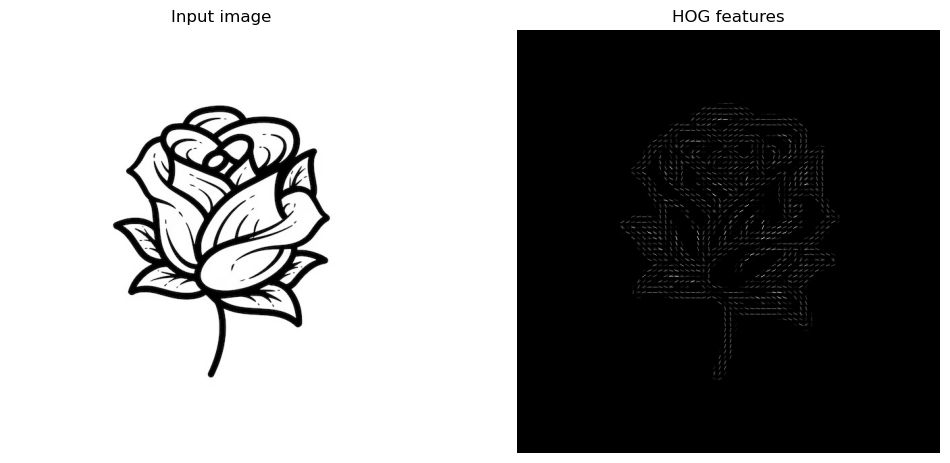

In [85]:
# Load the image

image = io.imread('b&w_flower.jpeg')

# Convert the image to grayscale
#image = color.rgb2(image)

# Compute HOG features and the HOG image
hog_features, hog_image = feature.hog(image, 
                                      pixels_per_cell=(8, 8),
                                      cells_per_block=(2, 2),
                                      visualize=True,
                                      channel_axis=-1
                                      )

# Plot the original image and the HOG image
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6), sharex=True, sharey=True)

ax1.axis('off')
ax1.imshow(image)
ax1.set_title('Input image')

ax2.axis('off')
ax2.imshow(hog_image, cmap=plt.cm.gray)
ax2.set_title('HOG features')

plt.show()

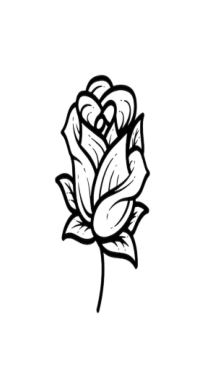

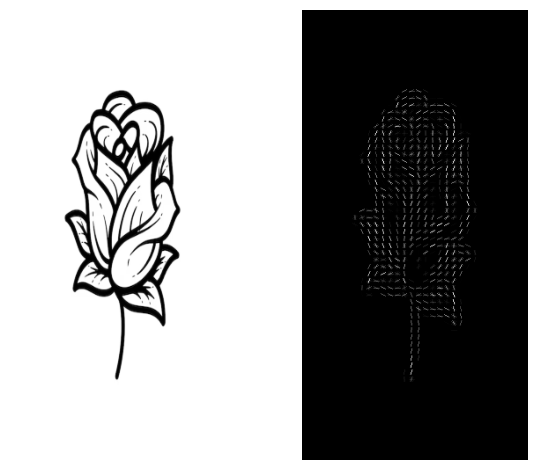

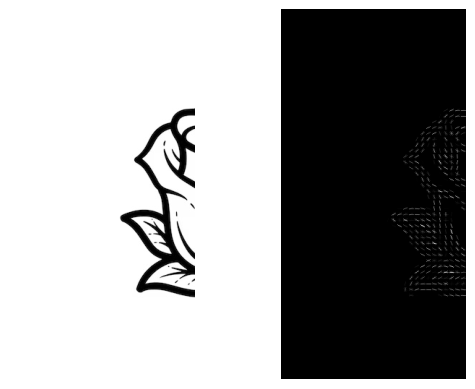

In [86]:
from skimage.feature import hog
from skimage import io
from skimage.transform import resize
import matplotlib.pyplot as plt
import cv2

# Load the black-and-white image
image = io.imread('b&w_flower.jpeg')

# Ensure the image is grayscale (2D)
if len(image.shape) == 3 and image.shape[2] == 3:
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Resize the image for HOG
resized_img = resize(image, (128 * 4, 64 * 4), anti_aliasing=True)

# Display the resized grayscale image
plt.axis("off")
plt.imshow(resized_img, cmap='gray')  # Make sure to use cmap='gray'
plt.show()

# Compute HOG features and visualization
fd, hog_image = hog(resized_img, orientations=9, pixels_per_cell=(8, 8), cells_per_block=(2, 2), visualize=True)

# Display the HOG visualization
plt.subplot(1, 2, 1)
plt.axis("off")
plt.imshow(resized_img, cmap='gray')  # Grayscale input

plt.subplot(1, 2, 2)
plt.axis("off")
plt.imshow(hog_image, cmap='gray')  # HOG result in grayscale

plt.tight_layout()
plt.show()

# Cropping the image and applying HOG
x, y, h, w = 0, 0, 512, 256
crop_img = image[y:y + h, x:x + w]

# Ensure cropped image is treated as grayscale
fd_crop_img, hog_crop_img = hog(crop_img, orientations=9, pixels_per_cell=(8, 8), cells_per_block=(2, 2), visualize=True)

# Display the cropped image and its HOG
plt.subplot(1, 2, 1)
plt.axis("off")
plt.imshow(crop_img, cmap='gray')  # Display cropped image in grayscale

plt.subplot(1, 2, 2)
plt.axis("off")
plt.imshow(hog_crop_img, cmap='gray')  # HOG visualization in grayscale

plt.show()


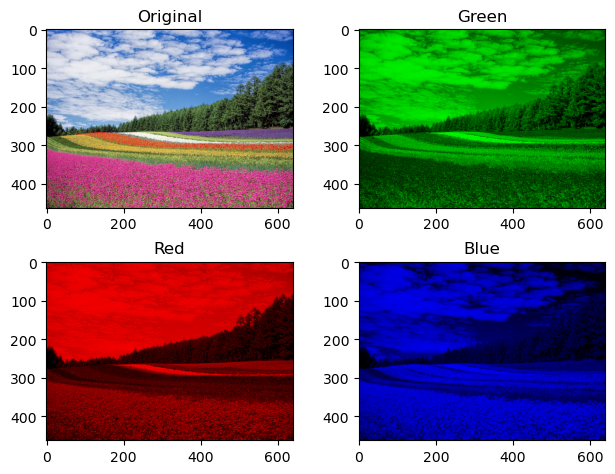

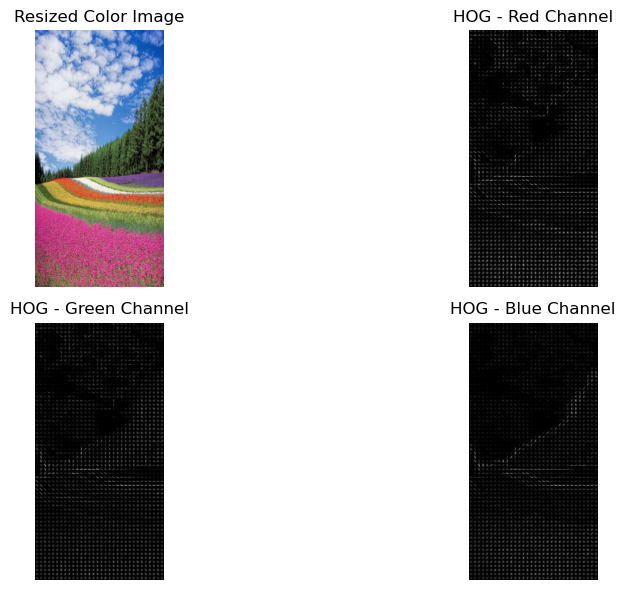

Combined HOG feature vector shape: (210924,)


In [87]:
from skimage.feature import hog
from skimage import io
from skimage.transform import resize
import matplotlib.pyplot as plt
import numpy as np

# Load the color image
image = io.imread('flower_field.jpg')


b = image.copy()
# set green and red channels to 0
b[:, :, 1] = 0
b[:, :, 2] = 0


g = image.copy()
# set blue and red channels to 0
g[:, :, 0] = 0
g[:, :, 2] = 0

r = image.copy()
# set blue and green channels to 0
r[:, :, 0] = 0
r[:, :, 1] = 0


plt.subplot(2,2,1)
plt.title("Original")
plt.imshow(image)
 
    
plt.subplot(2,2,2)
plt.title("Green")
plt.imshow(cv2.cvtColor(g, cv2.COLOR_BGR2RGB))

 
plt.subplot(2,2,3)
plt.title("Red")
plt.imshow(cv2.cvtColor(r, cv2.COLOR_BGR2RGB))


plt.subplot(2,2,4)
plt.title("Blue")
plt.imshow(cv2.cvtColor(b, cv2.COLOR_BGR2RGB))

 
plt.tight_layout()
plt.show()


# Resize the image for HOG
resized_img = resize(image, (128 * 4, 64 * 4), anti_aliasing=True)

# Split into color channels (R, G, B)
r_channel = resized_img[:, :, 0]
g_channel = resized_img[:, :, 1]
b_channel = resized_img[:, :, 2]

# Compute HOG for each channel
fd_r, hog_image_r = hog(r_channel, orientations=9, pixels_per_cell=(8, 8), cells_per_block=(2, 2), visualize=True)
fd_g, hog_image_g = hog(g_channel, orientations=9, pixels_per_cell=(8, 8), cells_per_block=(2, 2), visualize=True)
fd_b, hog_image_b = hog(b_channel, orientations=9, pixels_per_cell=(8, 8), cells_per_block=(2, 2), visualize=True)

# Concatenate the HOG features from each channel
hog_features_combined = np.concatenate([fd_r, fd_g, fd_b])

# Visualize the HOG for each channel
plt.figure(figsize=(12, 6))

# Original resized image
plt.subplot(2, 2, 1)
plt.axis("off")
plt.title('Resized Color Image')
plt.imshow(resized_img)

# HOG for Red channel
plt.subplot(2, 2, 2)
plt.axis("off")
plt.title('HOG - Red Channel')
plt.imshow(hog_image_r, cmap='gray')

# HOG for Green channel
plt.subplot(2, 2, 3)
plt.axis("off")
plt.title('HOG - Green Channel')
plt.imshow(hog_image_g, cmap='gray')

# HOG for Blue channel
plt.subplot(2, 2, 4)
plt.axis("off")
plt.title('HOG - Blue Channel')
plt.imshow(hog_image_b, cmap='gray')

plt.tight_layout()
plt.show()

# Print the shape of the concatenated HOG features
print(f"Combined HOG feature vector shape: {hog_features_combined.shape}")


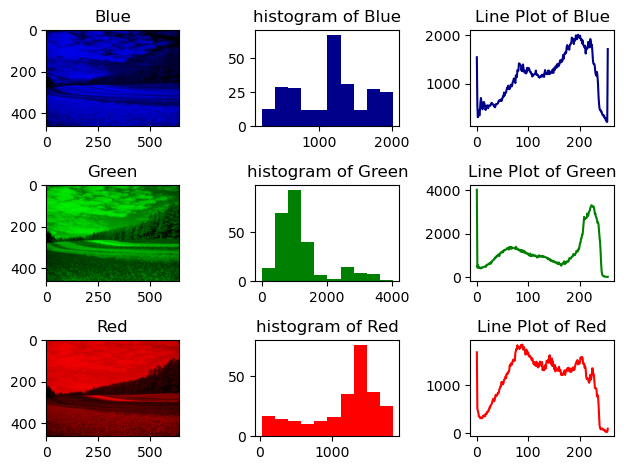

In [88]:
# Get RGB data from image
# cv2.calchist([imageObject], [channelValue], mask, [histSize], [low,high])

blue_color = cv2.calcHist([image], [0], None, [256], [0, 256])
red_color = cv2.calcHist([image], [1], None, [256], [0, 256])
green_color = cv2.calcHist([image], [2], None, [256], [0, 256])

plt.subplot(3,3,1)
plt.title("Blue")
plt.imshow(cv2.cvtColor(b, cv2.COLOR_BGR2RGB))

plt.subplot(3,3,4)
plt.title("Green")
plt.imshow(cv2.cvtColor(g, cv2.COLOR_BGR2RGB))

plt.subplot(3,3,7)
plt.title("Red")
plt.imshow(cv2.cvtColor(r, cv2.COLOR_BGR2RGB))

# three histograms
plt.subplot(3,3,2)
plt.title("histogram of Blue")
plt.hist(blue_color,color="darkblue")
 
plt.subplot(3,3,5)
plt.title("histogram of Green")
plt.hist(green_color,color="green")
 
plt.subplot(3,3,8)
plt.title("histogram of Red")
plt.hist(red_color,color="red")

# three line plots
plt.subplot(3,3,3)
plt.title("Line Plot of Blue")
plt.plot(blue_color,color="darkblue")
 
plt.subplot(3,3,6)
plt.title("Line Plot of Green")
plt.plot(green_color,color="green")
 
plt.subplot(3,3,9)
plt.title("Line Plot of Red")
plt.plot(red_color,color="red")
 
plt.tight_layout()
plt.show()

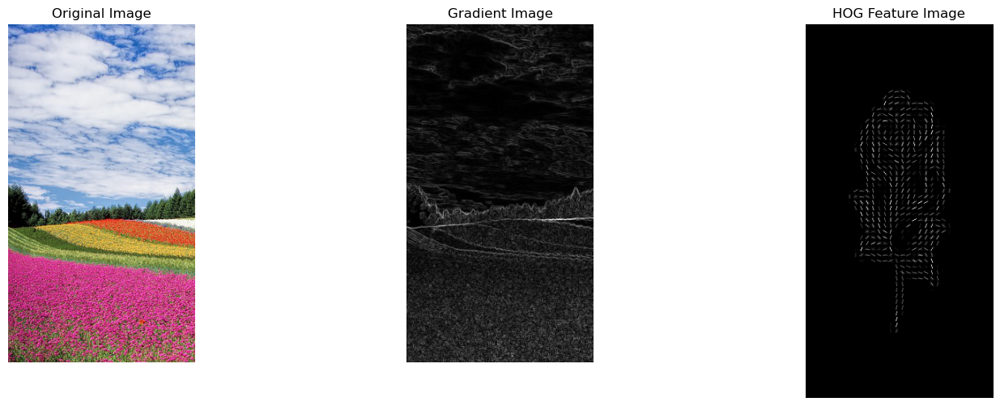

In [89]:
from skimage.filters import sobel

# Compute the gradient image using Sobel filter

gradient_image = sobel(color.rgb2gray(image))

# Plot the original image, gradient image, and HOG feature image
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6), sharex=True, sharey=True)

ax1.axis('off')
ax1.imshow(image)
ax1.set_title('Original Image')

ax2.axis('off')
ax2.imshow(gradient_image, cmap=plt.cm.gray)
ax2.set_title('Gradient Image')

ax3.axis('off')
ax3.imshow(hog_image, cmap=plt.cm.gray)
ax3.set_title('HOG Feature Image')

plt.show()

## Local Binary Patterns

1. Write a Python function to compute the LBP of a given grayscale image. Use the basic 8-
neighbor LBP method.
2. Your function should output the LBP image, where each pixel is replaced by its
corresponding LBP value.
3. Write a Python function to compute the histogram of the LBP image.
4. Plot the histogram and explain what it represents in terms of the texture features of the
image.
5. Apply your LBP function to at least three different grayscale images (e.g., a natural scene, a
texture, and a face image).
6. Generate and compare the histograms of the LBP images.
7. Discuss the differences in the histograms and what they tell you about the textures of the
different images.

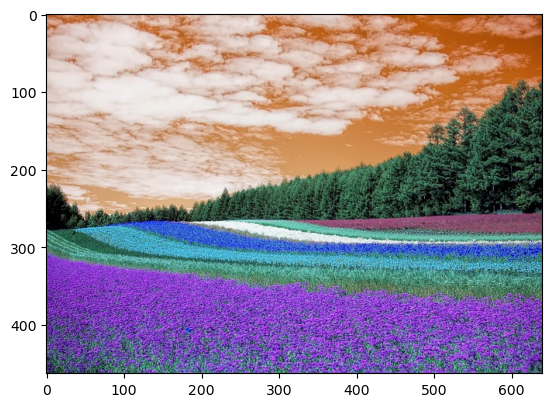

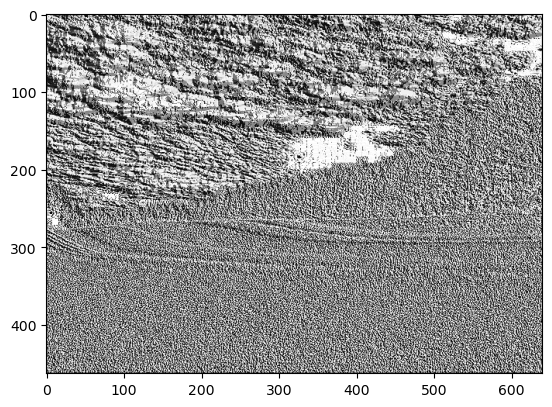

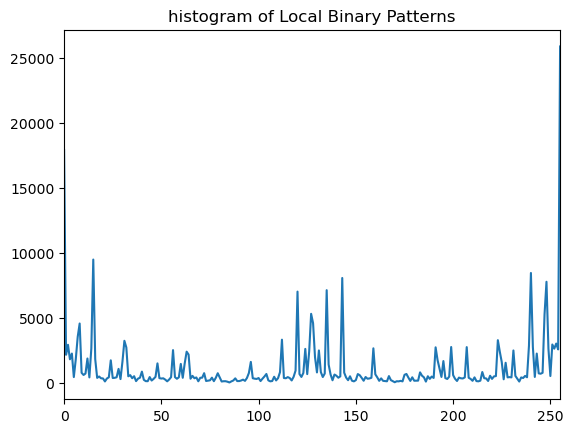

In [90]:
img = cv2.imread('flower_field.jpg',0)

# local Binary Patterns
def get_pixel(img, center, x, y):
      
    new_value = 0
      
    try:
        # If local neighbourhood pixel 
        # value is greater than or equal
        # to center pixel values then 
        # set it to 1
        if img[x][y] >= center:
            new_value = 1
              
    except:
        # Exception is required when 
        # neighbourhood value of a center
        # pixel value is null i.e. values
        # present at boundaries.
        pass
      
    return new_value
   
# Function for calculating LBP
def lbp_calculated_pixel(img, x, y):
   
    center = img[x][y]
   
    val_ar = []
      
    # top_left
    val_ar.append(get_pixel(img, center, x-1, y-1))
      
    # top
    val_ar.append(get_pixel(img, center, x-1, y))
      
    # top_right
    val_ar.append(get_pixel(img, center, x-1, y + 1))
      
    # right
    val_ar.append(get_pixel(img, center, x, y + 1))
      
    # bottom_right
    val_ar.append(get_pixel(img, center, x + 1, y + 1))
      
    # bottom
    val_ar.append(get_pixel(img, center, x + 1, y))
      
    # bottom_left
    val_ar.append(get_pixel(img, center, x + 1, y-1))
      
    # left
    val_ar.append(get_pixel(img, center, x, y-1))
       
    # Now, we need to convert binary
    # values to decimal
    power_val = [1, 2, 4, 8, 16, 32, 64, 128]
   
    val = 0
      
    for i in range(len(val_ar)):
        val += val_ar[i] * power_val[i]
          
    return val
   
path = 'flower_field.jpg'
img_bgr = cv2.imread(path, 1)

if img_bgr is None:
    raise FileNotFoundError(f"Image at path '{path}' not found.")

height, width, _ = img_bgr.shape

# We need to convert RGB image 
# into gray one because gray 
# image has one channel only.
img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
   
# Create a numpy array as 
# the same height and width 
# of RGB image
img_lbp = np.zeros((height, width), np.uint8)
   
for i in range(0, height):
    for j in range(0, width):
        img_lbp[i, j] = lbp_calculated_pixel(img_gray, i, j)
  
plt.imshow(img_bgr)
plt.show()
   
plt.imshow(img_lbp, cmap ="gray")
plt.show()

#once we have the local binary patterns, now create the histogram
hist,bin = np.histogram(img_lbp.ravel(),256,[0,255])
plt.xlim([0,255])
plt.plot(hist)
plt.title('histogram of Local Binary Patterns')
plt.show()

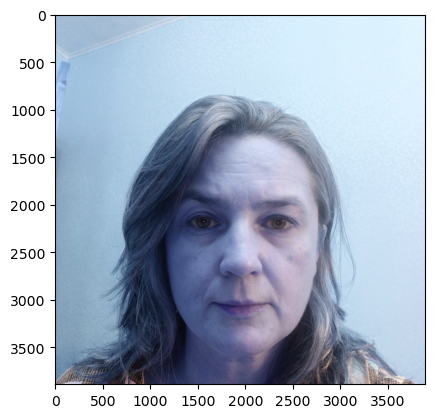

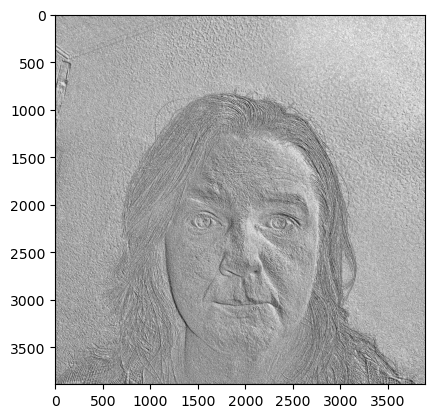

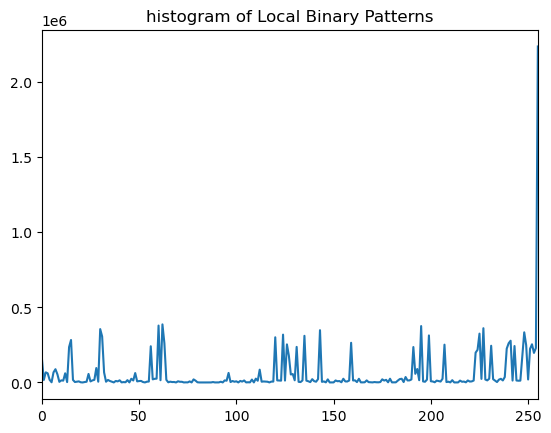

In [91]:
img = cv2.imread('images/13/Neutral.jpg',0)

# local Binary Patterns
def get_pixel(img, center, x, y):
      
    new_value = 0
      
    try:
        # If local neighbourhood pixel 
        # value is greater than or equal
        # to center pixel values then 
        # set it to 1
        if img[x][y] >= center:
            new_value = 1
              
    except:
        # Exception is required when 
        # neighbourhood value of a center
        # pixel value is null i.e. values
        # present at boundaries.
        pass
      
    return new_value
   
# Function for calculating LBP
def lbp_calculated_pixel(img, x, y):
   
    center = img[x][y]
   
    val_ar = []
      
    # top_left
    val_ar.append(get_pixel(img, center, x-1, y-1))
      
    # top
    val_ar.append(get_pixel(img, center, x-1, y))
      
    # top_right
    val_ar.append(get_pixel(img, center, x-1, y + 1))
      
    # right
    val_ar.append(get_pixel(img, center, x, y + 1))
      
    # bottom_right
    val_ar.append(get_pixel(img, center, x + 1, y + 1))
      
    # bottom
    val_ar.append(get_pixel(img, center, x + 1, y))
      
    # bottom_left
    val_ar.append(get_pixel(img, center, x + 1, y-1))
      
    # left
    val_ar.append(get_pixel(img, center, x, y-1))
       
    # Now, we need to convert binary
    # values to decimal
    power_val = [1, 2, 4, 8, 16, 32, 64, 128]
   
    val = 0
      
    for i in range(len(val_ar)):
        val += val_ar[i] * power_val[i]
          
    return val
   
path = 'images/13/Neutral.jpg'
img_bgr = cv2.imread(path, 1)

if img_bgr is None:
    raise FileNotFoundError(f"Image at path '{path}' not found.")

height, width, _ = img_bgr.shape

# We need to convert RGB image 
# into gray one because gray 
# image has one channel only.
img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
   
# Create a numpy array as 
# the same height and width 
# of RGB image
img_lbp = np.zeros((height, width), np.uint8)
   
for i in range(0, height):
    for j in range(0, width):
        img_lbp[i, j] = lbp_calculated_pixel(img_gray, i, j)
  
plt.imshow(img_bgr)
plt.show()
   
plt.imshow(img_lbp, cmap ="gray")
plt.show()

#once we have the local binary patterns, now create the histogram
hist,bin = np.histogram(img_lbp.ravel(),256,[0,255])
plt.xlim([0,255])
plt.plot(hist)
plt.title('histogram of Local Binary Patterns')
plt.show()

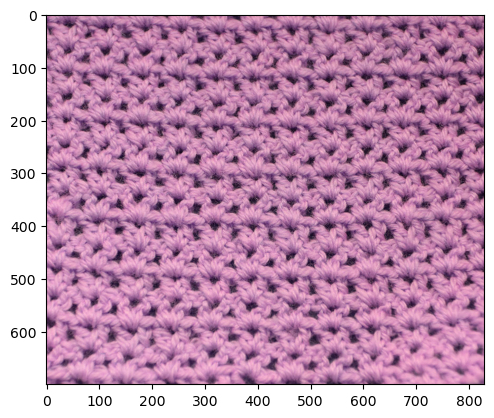

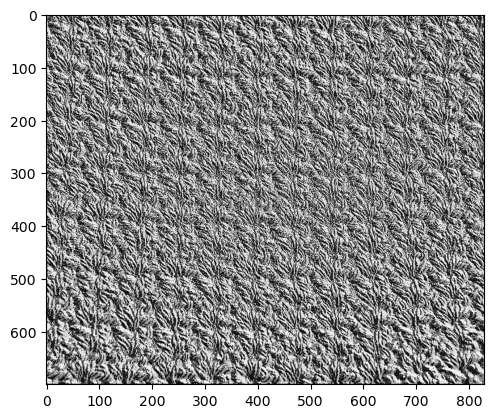

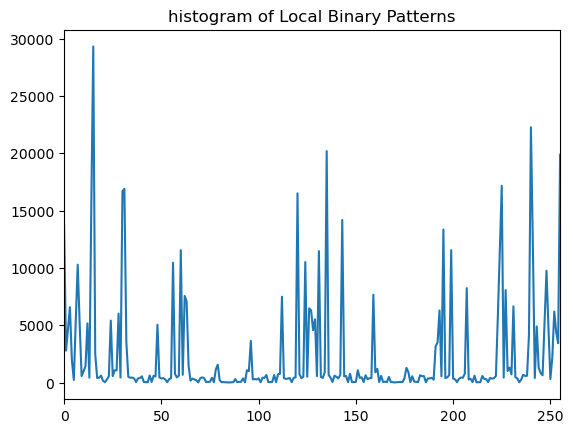

In [92]:
img = cv2.imread('strikk.png',0)

# local Binary Patterns
def get_pixel(img, center, x, y):
      
    new_value = 0
      
    try:
        # If local neighbourhood pixel 
        # value is greater than or equal
        # to center pixel values then 
        # set it to 1
        if img[x][y] >= center:
            new_value = 1
              
    except:
        # Exception is required when 
        # neighbourhood value of a center
        # pixel value is null i.e. values
        # present at boundaries.
        pass
      
    return new_value
   
# Function for calculating LBP
def lbp_calculated_pixel(img, x, y):
   
    center = img[x][y]
   
    val_ar = []
      
    # top_left
    val_ar.append(get_pixel(img, center, x-1, y-1))
      
    # top
    val_ar.append(get_pixel(img, center, x-1, y))
      
    # top_right
    val_ar.append(get_pixel(img, center, x-1, y + 1))
      
    # right
    val_ar.append(get_pixel(img, center, x, y + 1))
      
    # bottom_right
    val_ar.append(get_pixel(img, center, x + 1, y + 1))
      
    # bottom
    val_ar.append(get_pixel(img, center, x + 1, y))
      
    # bottom_left
    val_ar.append(get_pixel(img, center, x + 1, y-1))
      
    # left
    val_ar.append(get_pixel(img, center, x, y-1))
       
    # Now, we need to convert binary
    # values to decimal
    power_val = [1, 2, 4, 8, 16, 32, 64, 128]
   
    val = 0
      
    for i in range(len(val_ar)):
        val += val_ar[i] * power_val[i]
          
    return val
   
path = 'strikk.png'
img_bgr = cv2.imread(path, 1)

if img_bgr is None:
    raise FileNotFoundError(f"Image at path '{path}' not found.")

height, width, _ = img_bgr.shape

# We need to convert RGB image 
# into gray one because gray 
# image has one channel only.
img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
   
# Create a numpy array as 
# the same height and width 
# of RGB image
img_lbp = np.zeros((height, width), np.uint8)
   
for i in range(0, height):
    for j in range(0, width):
        img_lbp[i, j] = lbp_calculated_pixel(img_gray, i, j)
  
plt.imshow(img_bgr)
plt.show()
   
plt.imshow(img_lbp, cmap ="gray")
plt.show()

#once we have the local binary patterns, now create the histogram
hist,bin = np.histogram(img_lbp.ravel(),256,[0,255])
plt.xlim([0,255])
plt.plot(hist)
plt.title('histogram of Local Binary Patterns')
plt.show()

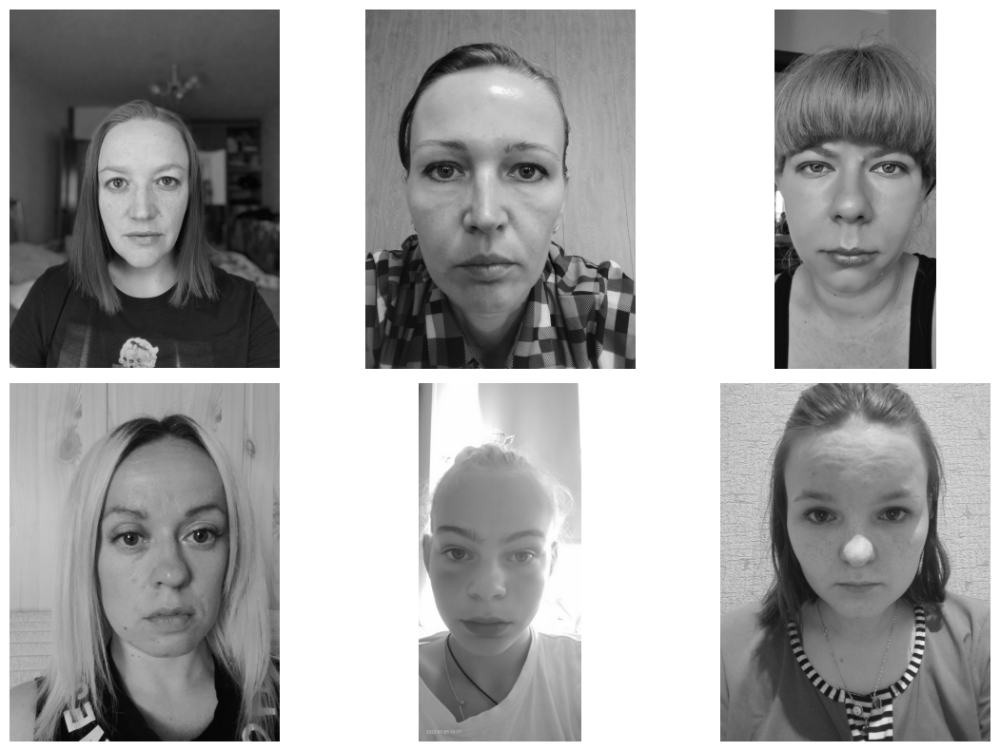

In [93]:
import os
from PIL import Image
import matplotlib.pyplot as plt
# Folder containing the grayscale images
folder_path = "Grayscale portrait"  # Corrected folder name

image_paths = [os.path.join(folder_path, img) for img in ['Neutral.jpg', 'Neutral_2.jpg', 'Neutral_3.jpg', 'Neutral_4.jpg', 'Neutral_5.jpg', 'Neutral_6.jpg']]

# Create a grid of 2x3 to display the images
n_rows = 2
n_cols = 3
# Create a figure and a grid of subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 8))
axes = axes.ravel()

# Check if the folder exists
if not os.path.exists(folder_path):
    raise FileNotFoundError(f"The directory '{folder_path}' does not exist.")


for i in range(6):
    img = Image.open(image_paths[i])  # Open image
    axes[i].imshow(img)  # Display image in respective subplot
    axes[i].axis('off')  # Hide axes

# Display the grid
plt.tight_layout()
plt.show()


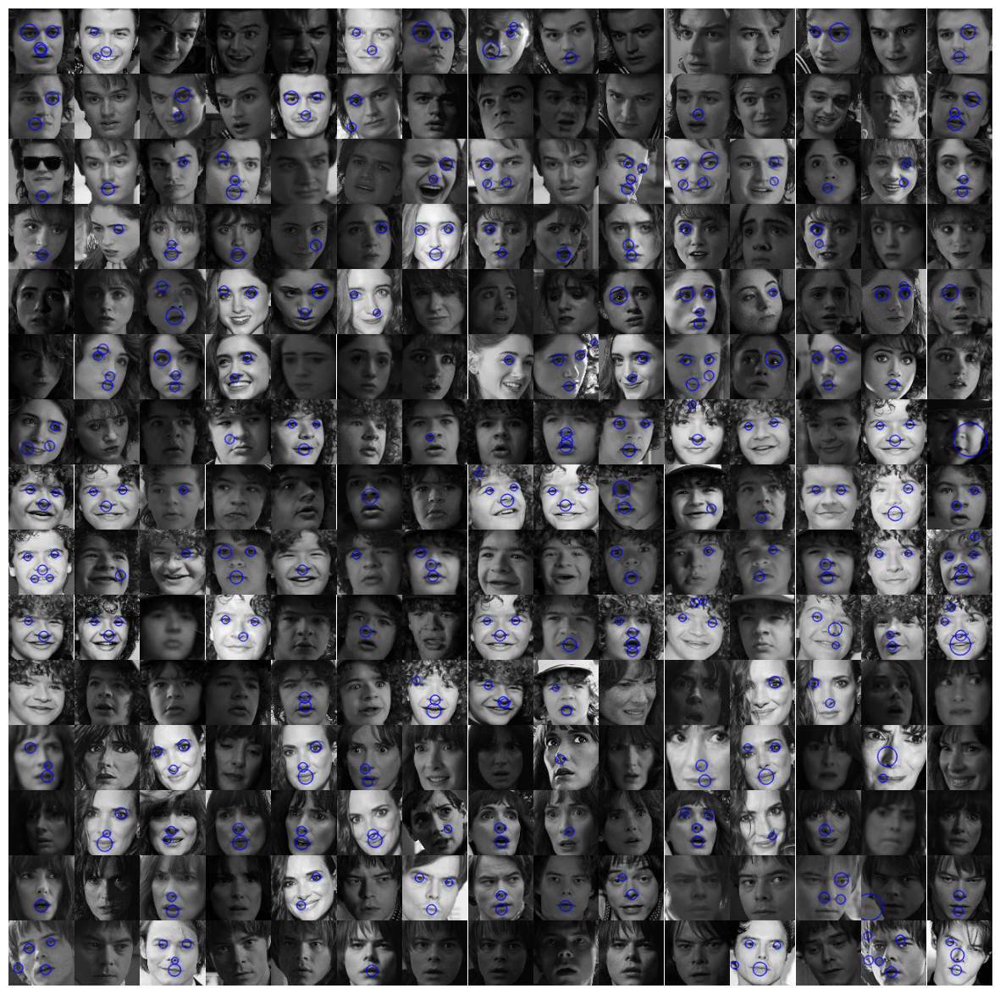

In [98]:
import os
from PIL import Image
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Function to collect all images from a folder (including subfolders)
def collect_images_from_folder(folder_path):
    image_paths = []
    # Walk through all subfolders and gather image file paths
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            # Add conditions for image file types if necessary
            if file.endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif')):
                image_paths.append(os.path.join(root, file))
    return image_paths

# Function to apply blob detection to each image
def apply_blob_detection(image_paths):
    # Setup SimpleBlobDetector parameters.
    params = cv2.SimpleBlobDetector_Params()

    # Change thresholds
    params.minThreshold = 50
    params.maxThreshold = 220

    # Filter by Area.
    params.filterByArea = True
    params.minArea = 50
    params.maxArea = 2000  

    # Filter by Circularity
    params.filterByCircularity = True
    params.minCircularity = 0.3

    # Filter by Convexity
    params.filterByConvexity = False
    #params.minConvexity = 0.87

    # Filter by Inertia
    params.filterByInertia = True
    params.minInertiaRatio = 0.01

    # Create a detector with the parameters
    ver = (cv2.__version__).split('.')
    if int(ver[0]) < 3:
        detector = cv2.SimpleBlobDetector(params)
    else:
        detector = cv2.SimpleBlobDetector_create(params)

    # Prepare to store blob-detected images
    blob_detected_images = []

    for img_path in image_paths:
        # Open the image using PIL, convert to grayscale, and resize
        img = Image.open(img_path).convert('L').resize((86, 86))
        img_array = np.array(img)

        # Convert to OpenCV format
        im_cv = img_array.astype(np.uint8)

        # Detect blobs
        keypoints = detector.detect(im_cv)

        # Draw detected blobs as red circles
        im_with_keypoints = cv2.drawKeypoints(im_cv, keypoints, np.array([]), (0, 0, 255), cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

        # Append the image with detected blobs to the list
        blob_detected_images.append(im_with_keypoints)

    return blob_detected_images

# Function to display images (with blobs detected) in a grid
def display_images_in_grid(images, rows=15, cols=15):
    total_images = rows * cols
    images_to_display = images[:total_images]

    fig, axs = plt.subplots(rows, cols, figsize=(cols, rows), gridspec_kw={'wspace': 0, 'hspace': 0})
    
    # Remove padding between images
    plt.subplots_adjust(wspace=0, hspace=0)
    
    for i, ax in enumerate(axs.ravel()):
        if i < len(images_to_display):
            # Display each blob-detected image
            ax.imshow(images_to_display[i], cmap='gray')
            ax.axis('off')  # No axis, just the image
        else:
            ax.axis('off')  # In case there are fewer images than grid spots

    plt.show()

# Folder containing the images
folder_path = 'Stranger things grayscale'  # Update with your folder path

# Collect all image paths
image_paths = collect_images_from_folder(folder_path)

# Apply blob detection to the collected images
blob_detected_images = apply_blob_detection(image_paths)

# Display blob-detected images in a 15x15 grid
display_images_in_grid(blob_detected_images, rows=15, cols=15)


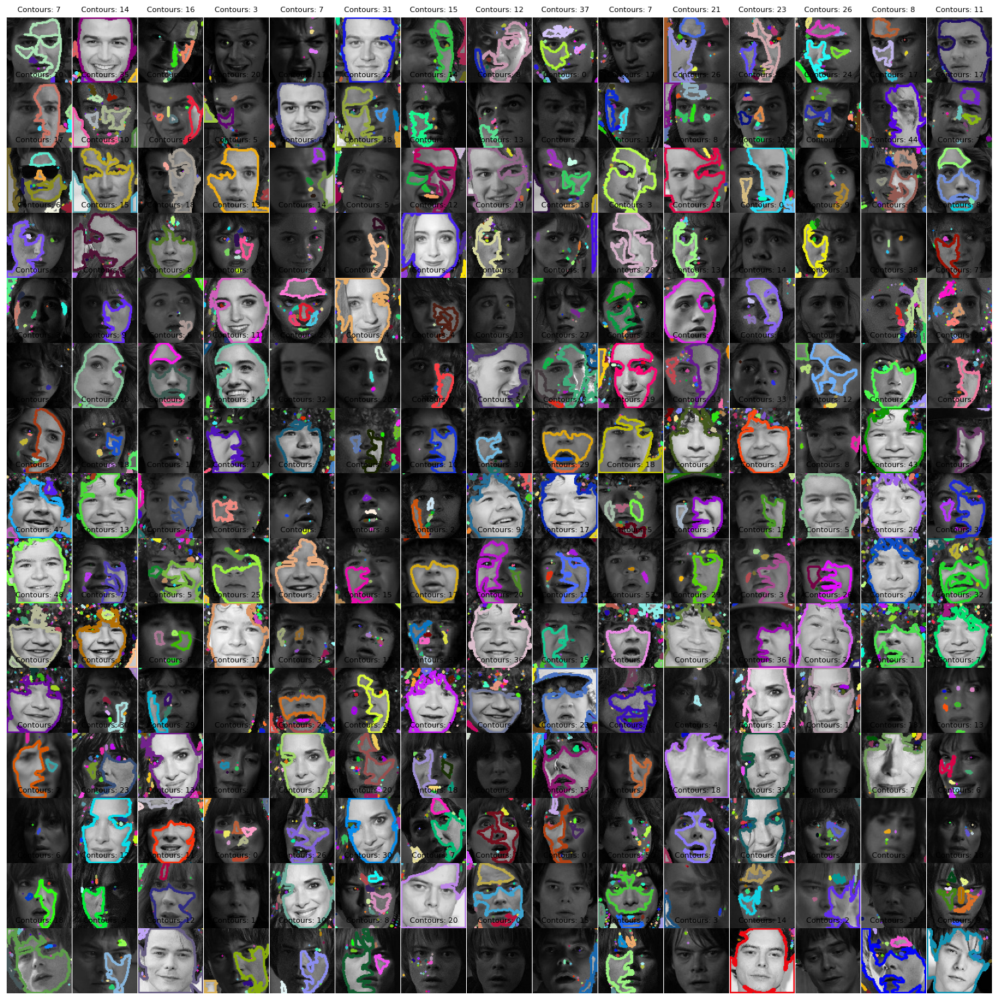

Image: Stranger things grayscale/09-Steve/Stranger-Things-season-3-screenshots-Chapter-3-The-Case-of-the-Missing-Lifeguard-105.jpg-nggid041161-ngg0dyn-1440x716x100-00f0w010c010r110f110r010t010-1.jpg
Number of contours detected: 7
Contour 1: Area = 1.00, Perimeter = 4.00
Contour 2: Area = 2.00, Perimeter = 6.00
Contour 3: Area = 15.00, Perimeter = 19.66
Contour 4: Area = 0.00, Perimeter = 2.00
Contour 5: Area = 0.00, Perimeter = 0.00
Contour 6: Area = 25.50, Perimeter = 26.73
Contour 7: Area = 1802.50, Perimeter = 453.61


Image: Stranger things grayscale/09-Steve/A8sB8zJXLqdf15kF1ygn-2.jpg
Number of contours detected: 14
Contour 1: Area = 0.00, Perimeter = 0.00
Contour 2: Area = 0.00, Perimeter = 4.00
Contour 3: Area = 0.00, Perimeter = 2.00
Contour 4: Area = 0.50, Perimeter = 9.07
Contour 5: Area = 0.00, Perimeter = 6.83
Contour 6: Area = 0.50, Perimeter = 6.24
Contour 7: Area = 0.50, Perimeter = 3.41
Contour 8: Area = 57.50, Perimeter = 40.38
Contour 9: Area = 1.00, Perimeter = 14.49

In [101]:
import os
from PIL import Image
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random

# Function to collect all images from a folder (including subfolders)
def collect_images_from_folder(folder_path):
    image_paths = []
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            if file.endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif')):
                image_paths.append(os.path.join(root, file))
    return image_paths

# Function to generate random color
def random_color():
    return [random.randint(0, 255) for _ in range(3)]

# Function to apply contour detection to each image
def apply_contour_detection(image_paths):
    contour_statistics = []  # To store stats for each image
    contour_detected_images = []

    for img_path in image_paths:
        img = Image.open(img_path).convert('L').resize((86, 86))  # Grayscale and resize
        img_array = np.array(img)

        # Convert to OpenCV format
        im_cv = img_array.astype(np.uint8)

        # Apply threshold to binarize the image
        _, thresholded = cv2.threshold(im_cv, 100, 255, cv2.THRESH_BINARY)

        # Find contours
        contours, _ = cv2.findContours(thresholded, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        # Draw contours on the original image with random colors
        contour_image = cv2.cvtColor(im_cv, cv2.COLOR_GRAY2BGR)  # Convert to color for drawing colored contours
        contour_info = []

        for cnt in contours:
            color = random_color()  # Generate a random color for each contour
            cv2.drawContours(contour_image, [cnt], -1, color, 2)  # Draw contour

            # Calculate area and perimeter
            area = cv2.contourArea(cnt)
            perimeter = cv2.arcLength(cnt, True)
            contour_info.append((area, perimeter))

        # Store statistics for the current image
        contour_statistics.append({
            'num_contours': len(contours),
            'contour_info': contour_info
        })

        # Append the image with drawn contours to the list
        contour_detected_images.append(contour_image)

    return contour_detected_images, contour_statistics

# Function to display images (with contours detected) in a grid
def display_images_with_statistics(images, statistics, rows=15, cols=15):
    total_images = rows * cols
    images_to_display = images[:total_images]
    stats_to_display = statistics[:total_images]

    fig, axs = plt.subplots(rows, cols, figsize=(cols, rows), gridspec_kw={'wspace': 0, 'hspace': 0})
    
    plt.subplots_adjust(wspace=0, hspace=0)
    
    for i, ax in enumerate(axs.ravel()):
        if i < len(images_to_display):
            # Display each contour-detected image
            ax.imshow(cv2.cvtColor(images_to_display[i], cv2.COLOR_BGR2RGB))  # Convert BGR to RGB
            ax.axis('off')  # No axis, just the image
            
            # Display statistics on the image
            stats = stats_to_display[i]
            ax.set_title(f"Contours: {stats['num_contours']}", fontsize=8)
        else:
            ax.axis('off')  # In case there are fewer images than grid spots

    plt.tight_layout()
    plt.show()

# Folder containing the images
folder_path = 'Stranger things grayscale'  # Update with your folder path

# Collect all image paths
image_paths = collect_images_from_folder(folder_path)

# Apply contour detection to the collected images
contour_detected_images, contour_statistics = apply_contour_detection(image_paths)

# Display contour-detected images with statistics in a 15x15 grid
display_images_with_statistics(contour_detected_images, contour_statistics, rows=15, cols=15)

# Display detailed statistics
for idx, stats in enumerate(contour_statistics):
    print(f"Image: {image_paths[idx]}")
    print(f"Number of contours detected: {stats['num_contours']}")
    for i, (area, perimeter) in enumerate(stats['contour_info']):
        print(f"Contour {i + 1}: Area = {area:.2f}, Perimeter = {perimeter:.2f}")
    print("\n")
